Data Exploration

In [88]:
# import libraries:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)   # Adjusts the configuration of the plots

In [89]:
# Loading the dataset:
df = pd.read_csv('movies.csv')
df.head(10)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000.0,39754601.0,Paramount Pictures,95.0
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.9,188000.0,John Landis,Dan Aykroyd,John Belushi,United States,27000000.0,115229890.0,Universal Pictures,133.0
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.2,330000.0,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000.0,23402427.0,Chartoff-Winkler Productions,129.0
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.8,101000.0,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000.0,108185706.0,Dovemead Films,127.0
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.0,10000.0,Walter Hill,Bill Bryden,David Carradine,United States,10000000.0,15795189.0,United Artists,100.0


In [90]:
# looking for any possible missing data:
for col in df.columns:
  missing_rate = np.sum(df[col].isnull())
  print('{} - {}'.format(col, missing_rate))

name - 0
rating - 77
genre - 0
year - 0
released - 2
score - 3
votes - 3
director - 0
writer - 3
star - 1
country - 3
budget - 2171
gross - 189
company - 17
runtime - 4


In [91]:
df.describe()

,year,score,votes,budget,gross,runtime
count,7668.000000,7665.000000,7.665000e+03,5.497000e+03,7.479000e+03,7664.000000
mean,2000.405451,6.390411,8.810850e+04,3.558988e+07,7.850054e+07,107.261613
std,11.153508,0.968842,1.633238e+05,4.145730e+07,1.657251e+08,18.581247
min,1980.000000,1.900000,7.000000e+00,3.000000e+03,3.090000e+02,55.000000
25%,1991.000000,5.800000,9.100000e+03,1.000000e+07,4.532056e+06,95.000000
50%,2000.000000,6.500000,3.300000e+04,2.050000e+07,2.020576e+07,104.000000
75%,2010.000000,7.100000,9.300000e+04,4.500000e+07,7.601669e+07,116.000000
max,2020.000000,9.300000,2.400000e+06,3.560000e+08,2.847246e+09,366.000000


In [92]:
# change the data types of columns:
df['budget'] = pd.to_numeric(df['budget'], errors='coerce').astype('Int64')
df['gross'] = pd.to_numeric(df['gross'], errors='coerce').astype('Int64')
df['runtime'] = pd.to_numeric(df['runtime'], errors='coerce').astype('Int64')
df['votes'] = pd.to_numeric(df['votes'], errors='coerce').astype('Int64')

In [93]:
# Standardizing the released column:
df.dropna(subset=['released'], inplace=True)
df['released'] = df['released'].str.split(pat='(', expand=True)[0]
df['released'] = pd.to_datetime(df['released'], format='mixed').dt.date

In [94]:
# Creating a seprate release_year column:
df['release_year'] = df['released'].astype(str).str[:4]

In [ ]:
# Sorting the data by gross and budget columns:
df.sort_values(by=['gross'], inplace=False, ascending=False)

In [ ]:
df.sort_values(by=['budget'], inplace=False, ascending=False)

In [97]:
pd.set_option('display.max_rows', None)

<Axes: >

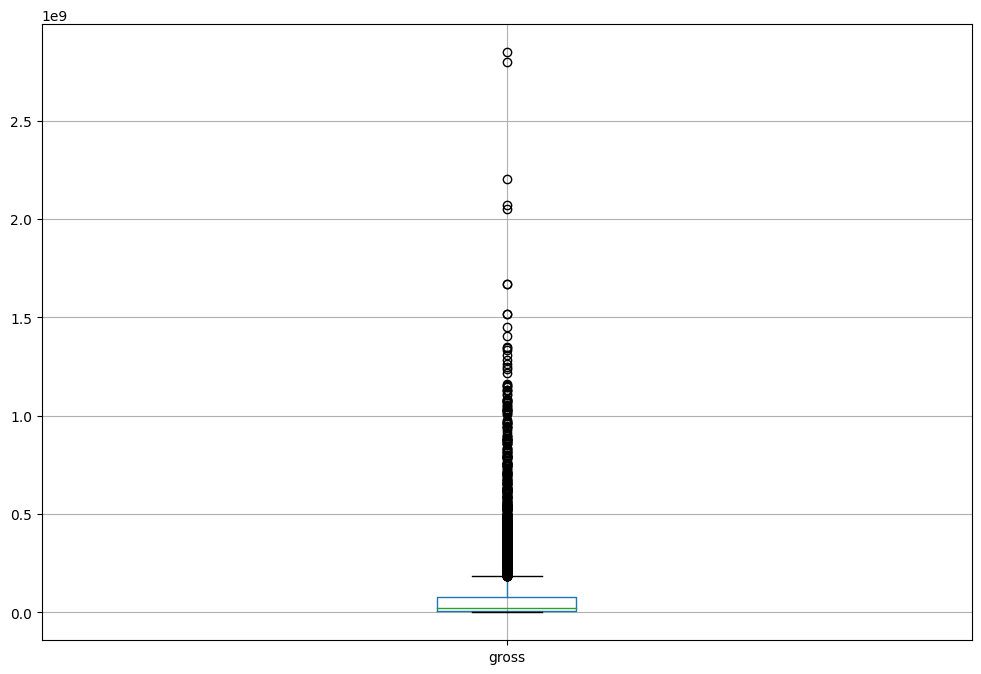

In [98]:
# Are there any Outliers?
df.boxplot(column=['gross'])

In [99]:
# Drop any duplicates:
df.drop_duplicates()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,release_year
0,The Shining,R,Drama,1980,1980-06-13,8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146,1980
1,The Blue Lagoon,R,Adventure,1980,1980-07-02,5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,1980-06-20,8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124,1980
3,Airplane!,PG,Comedy,1980,1980-07-02,7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88,1980
4,Caddyshack,R,Comedy,1980,1980-07-25,7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98,1980
5,Friday the 13th,R,Horror,1980,1980-05-09,6.4,123000,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95,1980
6,The Blues Brothers,R,Action,1980,1980-06-20,7.9,188000,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133,1980
7,Raging Bull,R,Biography,1980,1980-12-19,8.2,330000,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129,1980
8,Superman II,PG,Action,1980,1981-06-19,6.8,101000,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127,1981
9,The Long Riders,R,Biography,1980,1980-05-16,7.0,10000,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100,1980


Handling Missing Values

In [100]:
# rating column:
df[df['rating'].isnull()]
df.dropna(subset= ['rating'], inplace=True)

In [101]:
# score and votes column:
df[df['score'].isnull()]
df.dropna(subset=['score'], inplace=True)

In [102]:
# writer column:
df[df['writer'].isnull()]
df.loc[1820,'budget'] = 380000
misn_writers = {
    1820: "Derek Jarman",
    5834: "Unknown",
    7655: "Qianying Xie"
}

def update_writer(df, misn_writers):
    for i, writer in df['writer'].items():
        if pd.isna(writer)  and i in misn_writers:
            df.at[i, 'writer'] = misn_writers[i]

update_writer(df, misn_writers)

In [103]:
# star column:
df[df['star'].isnull()]
df.dropna(subset=['star'], inplace=True)

In [104]:
# country column:
df[df['country'].isnull()]
df.dropna(subset=['country'], inplace=True)

In [105]:
# company column:
df[df['company'].isnull()]
df.dropna(subset=['company'], inplace=True)

In [106]:
# runtime column:
df[df['runtime'].isnull()]
df.dropna(subset=['runtime'], inplace=True)

In [107]:
# Removing the NaN Values from both budget and gross column:
df[df['budget'].isnull() & df['gross'].isnull()].shape[0]
df.dropna(subset=['budget', 'gross'], how='all', inplace=True)

In [108]:
## Filling the NaN Values in both budget and gross column:
df['release_year'] = df['release_year'].astype(int) # Change the data type of release_year

# Define the function to get the time span (five-year periods)
def get_time_span(year):
    return f"{year // 5 * 5}-{year // 5 * 5 + 4}"

# Apply the function to create a time span column:
df['time_span'] = df['release_year'].apply(get_time_span)   # Created time span of five years

# Group by genre and time span, then calculate the mean budget and gross:
avg_values = df.groupby(['genre', 'time_span']).agg({'budget': 'mean', 'gross' : 'mean'}).reset_index()

avg_values

# Function to fill NaN values with the calculated averages:
def fill_na_values(row, avg_values):
  if pd.isna(row['budget']):
    avg_budget = avg_values[(avg_values['genre'] == row['genre']) & (avg_values['time_span'] == row['time_span'])]['budget']
    if not avg_budget.empty:
      row['budget'] = avg_budget.values[0]
  if pd.isna(row['gross']):
    avg_gross = avg_values[(avg_values['genre'] == row['genre']) & (avg_values['time_span'] == row['time_span'])]['gross']
    if not avg_gross.empty:
      row['gross'] = avg_gross.values[0]
  return row

# Apply the function to fill NaN values in the original DataFrame:
df = df.apply(fill_na_values, axis = 1, args = (avg_values,))

In [109]:
# budget and gross column:
df.dropna(subset=['budget'], inplace=True)
df.dropna(subset=['gross'], inplace=True)

In [110]:
# Converting budget and gross to float/int:
df['budget'] = df['budget'].astype(float)
df['gross'] = df['gross'].astype(float)

df['budget'] = df['budget'].astype(int)
df['gross'] = df['gross'].astype(int)

# df['budget'] = df['budget'].apply(lambda x: f'{x:.2f}')
# df['gross'] = df['gross'].apply(lambda x: f'{x:.2f}')

Removing any Unwanted Columns

In [112]:
df.drop('year', axis=1, inplace=True)

Correlation Analysis

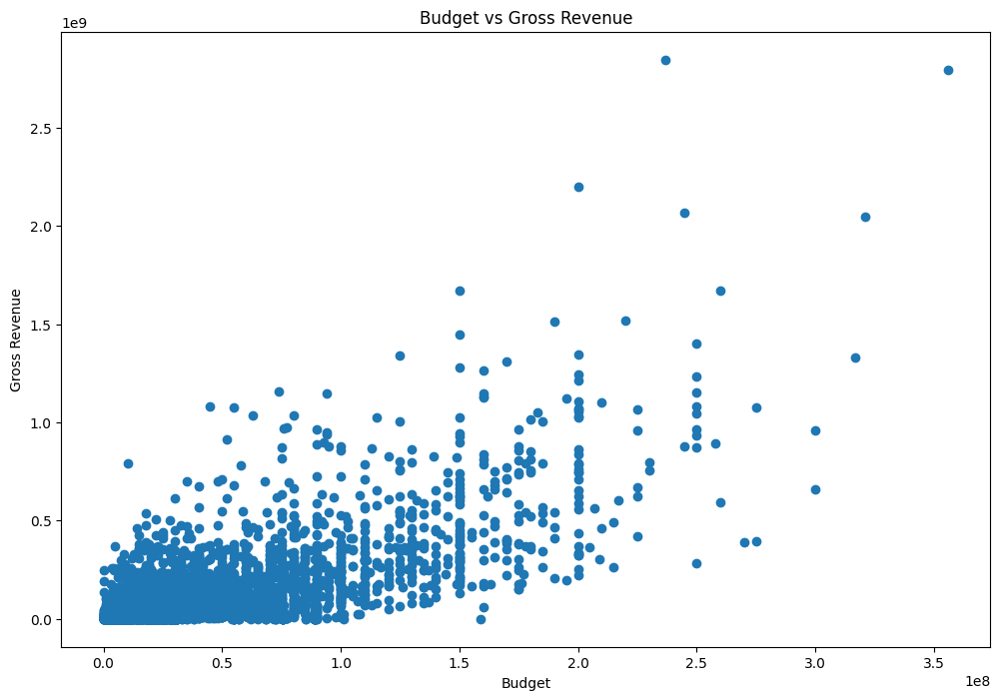

In [113]:
# Looking at Budget Column ->
# budget vs gross Column:
plt.scatter(x=df['budget'], y=df['gross'])

plt.title('Budget vs Gross Revenue')

plt.xlabel('Budget')

plt.ylabel('Gross Revenue')

plt.show()

<Axes: xlabel='budget', ylabel='gross'>

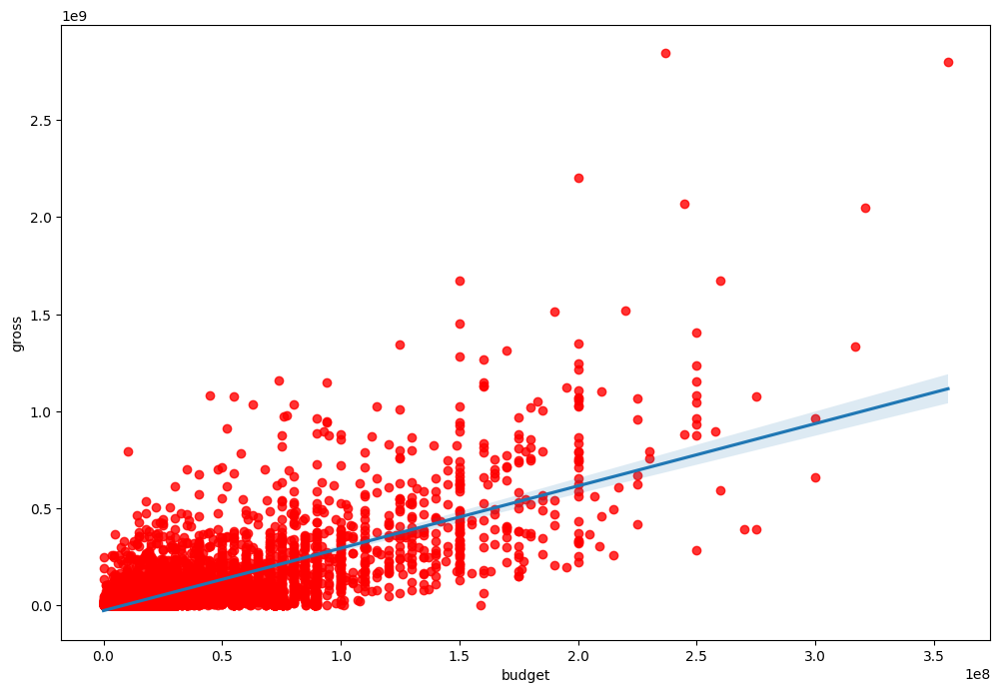

In [114]:
# Using regplot to check if correlation is present or not:
sns.regplot(x='budget', y='gross', data = df, scatter_kws={"color": "red"})

<Axes: xlabel='score', ylabel='gross'>

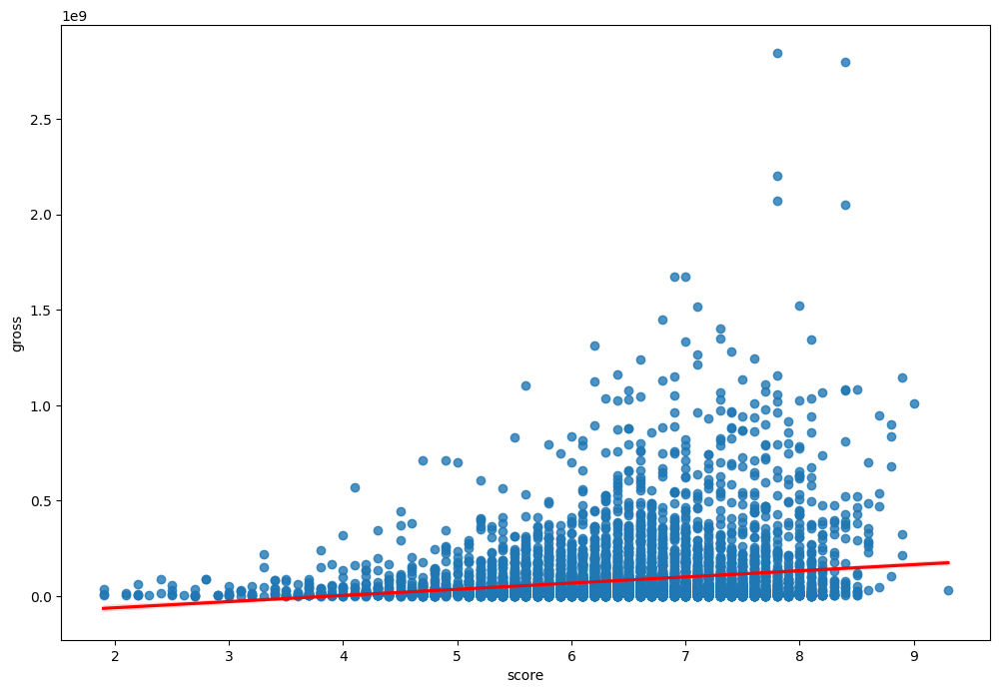

In [115]:
# score vs gross column:
sns.regplot(x="score", y="gross", data=df, line_kws={"color": "red"})

In [116]:
# Correlation Matrix of all numeric columns:
df.corr(method = 'pearson', numeric_only=True) #pearson, kendall, spearman

,score,votes,budget,gross,runtime,release_year
score,1.000000,0.414932,0.080281,0.188295,0.399400,0.108031
votes,0.414932,1.000000,0.441121,0.631079,0.310185,0.217342
budget,0.080281,0.441121,1.000000,0.718683,0.284414,0.351379
gross,0.188295,0.631079,0.718683,1.000000,0.244975,0.253775
runtime,0.399400,0.310185,0.284414,0.244975,1.000000,0.115402
release_year,0.108031,0.217342,0.351379,0.253775,0.115402,1.000000


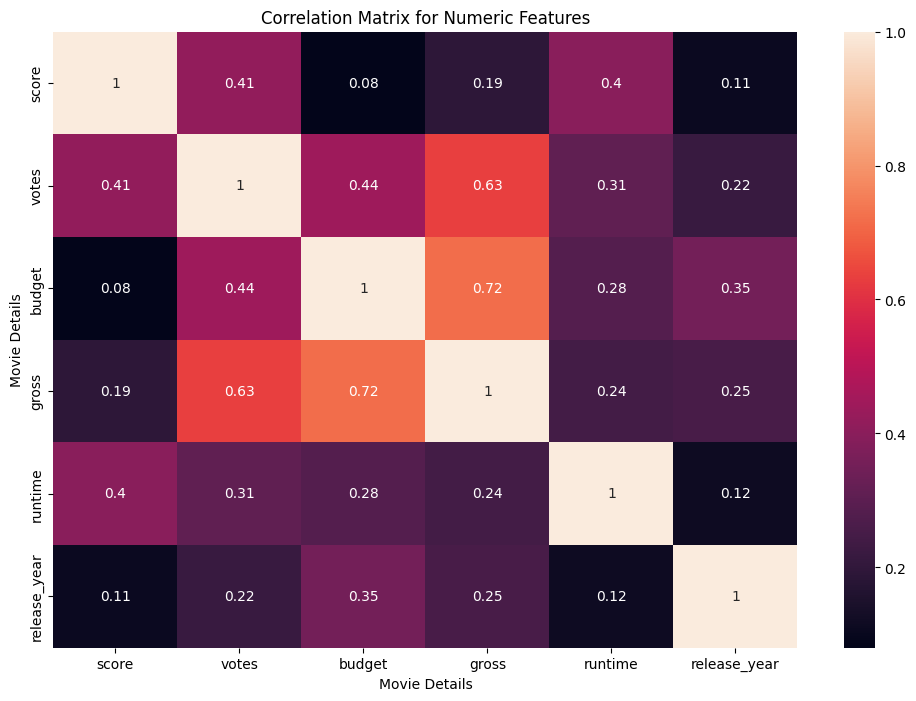

In [117]:
# Visual Representation of Correlation Matrix:
correlation_matrix = df.corr(method = 'pearson', numeric_only=True)
sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matrix for Numeric Features')

plt.xlabel('Movie Details')

plt.ylabel('Movie Details')

plt.show()

In [118]:
# Convert all object columns to Categorical and assign them unique numbers:
df_numarized = df.copy(deep=True)

for col_name in df_numarized.columns:
  if(df_numarized[col_name].dtype == 'object'):
    df_numarized[col_name] = df_numarized[col_name].astype('category')
    df_numarized[col_name] = df_numarized[col_name].cat.codes

df_numarized

,name,rating,genre,released,score,votes,director,writer,star,country,budget,gross,company,runtime,release_year,time_span
0,6407,6,6,16,8.4,927000,2487,3878,991,54,19000000,46998772,2208,146,1980,0
1,5405,6,1,20,5.8,65000,2187,1578,309,55,4500000,58853106,699,104,1980,0
2,4985,4,0,17,8.7,1200000,1069,2484,1656,55,18000000,538375067,1464,124,1980,0
3,277,4,4,20,7.7,221000,1254,1938,2130,55,3500000,83453539,1720,88,1980,0
4,998,6,4,23,7.3,108000,1015,502,391,55,6000000,39846344,1687,98,1980,0
5,2047,6,9,10,6.4,123000,2431,4220,228,55,550000,39754601,1720,95,1980,0
6,5406,6,0,17,7.9,188000,1364,803,1214,55,27000000,115229890,2171,133,1980,0
7,4295,6,3,38,8.2,330000,1764,1711,2124,55,18000000,23402427,602,129,1980,0
8,5121,4,0,61,6.8,101000,2221,1918,830,55,54000000,108185706,846,127,1981,0
9,6038,6,3,11,7.0,10000,2758,405,561,55,10000000,15795189,2163,100,1980,0


In [119]:
# Correlation Matrix of all columns:
df_numarized.corr(method = 'pearson', numeric_only=True) #pearson, kendall, spearman

,name,rating,genre,released,score,votes,director,writer,star,country,budget,gross,company,runtime,release_year,time_span
name,1.000000,-0.012066,0.019549,0.010584,0.016489,0.011719,0.008476,0.008920,0.005550,-0.011195,0.017740,0.005056,0.007770,0.009590,0.009829,0.010390
rating,-0.012066,1.000000,0.124818,0.023214,0.016276,0.014300,0.013316,-0.001100,0.004768,0.032523,-0.157346,-0.132253,-0.084097,0.068616,0.025108,0.027823
genre,0.019549,0.124818,1.000000,-0.082082,0.043300,-0.151303,-0.013154,0.013404,-0.002038,-0.028317,-0.390260,-0.246073,-0.075263,-0.044856,-0.082310,-0.082186
released,0.010584,0.023214,-0.082082,1.000000,0.109428,0.216676,-0.024275,-0.014105,-0.032605,-0.092698,0.351150,0.255749,-0.019417,0.118268,0.999171,0.991047
score,0.016489,0.016276,0.043300,0.109428,1.000000,0.414932,0.007671,0.019575,-0.000531,-0.128931,0.080281,0.188295,0.001097,0.399400,0.108031,0.108779
votes,0.011719,0.014300,-0.151303,0.216676,0.414932,1.000000,-0.000830,0.000199,-0.021973,0.066224,0.441121,0.631079,0.129429,0.310185,0.217342,0.215100
director,0.008476,0.013316,-0.013154,-0.024275,0.007671,-0.000830,1.000000,0.296414,0.035835,0.013076,0.000852,-0.014721,-0.000381,0.015235,-0.023159,-0.025699
writer,0.008920,-0.001100,0.013404,-0.014105,0.019575,0.000199,0.296414,1.000000,0.026274,0.013712,-0.029330,-0.024135,0.002863,-0.005700,-0.013151,-0.014106
star,0.005550,0.004768,-0.002038,-0.032605,-0.000531,-0.021973,0.035835,0.026274,1.000000,-0.018757,-0.015598,-0.002173,0.007312,0.009212,-0.033093,-0.034760
country,-0.011195,0.032523,-0.028317,-0.092698,-0.128931,0.066224,0.013076,0.013712,-0.018757,1.000000,0.024176,0.091104,0.090713,-0.083527,-0.092603,-0.092823


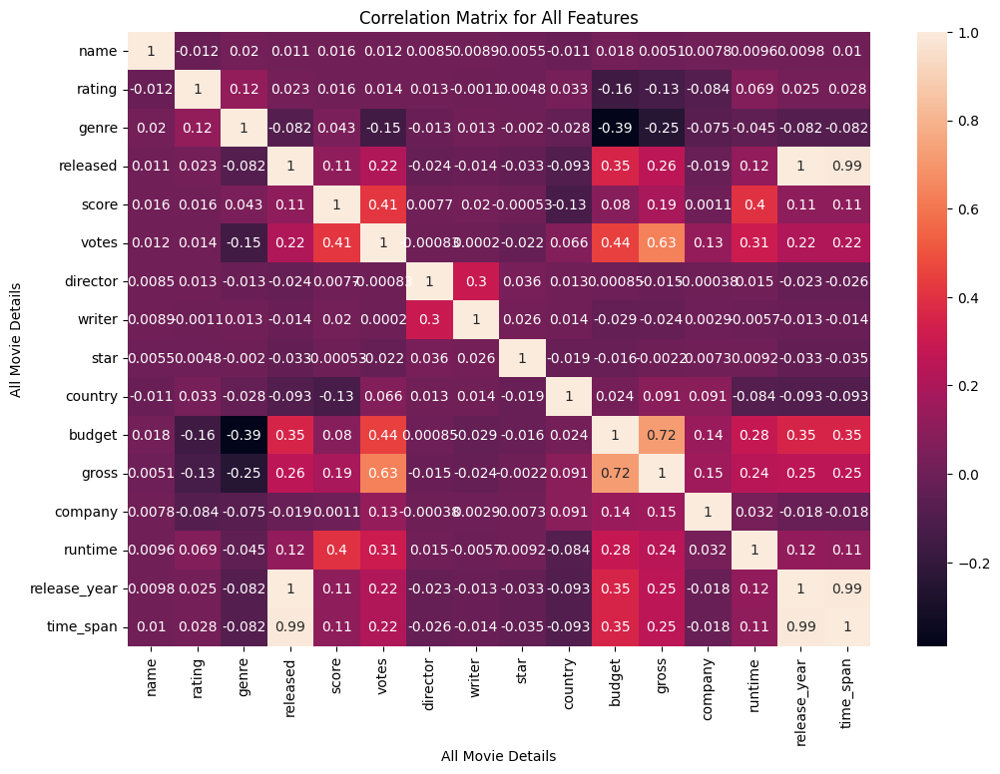

In [120]:
# Visual Representation of Correlation Matrix(All Columns):
corr_matrix = df_numarized.corr(method = 'pearson', numeric_only=True)
sns.heatmap(corr_matrix, annot=True)

plt.title('Correlation Matrix for All Features')

plt.xlabel('All Movie Details')

plt.ylabel('All Movie Details')

plt.show()

In [ ]:
# Created Pairs for each Column:
corr_matrix = df_numarized.corr(method = 'pearson', numeric_only=True)
pairs = corr_matrix.unstack()

pairs

In [ ]:
# Sorted the Pairs:
sorted_pairs = pairs.sort_values()
print(sorted_pairs)

In [ ]:
# Columns with High Correlation:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]
high_corr

In [124]:
# Top 15 companies by gross revenue:
CompanyGrossSum = df.groupby('company')[["gross"]].sum()

CompanyGrossSum_Sorted = CompanyGrossSum.sort_values('gross', ascending = False)[:15]

CompanyGrossSum_Sorted = CompanyGrossSum_Sorted['gross'].astype('int64')

CompanyGrossSum_Sorted

company
Warner Bros.                 56329179122
Universal Pictures           52514188890
Columbia Pictures            43008941346
Paramount Pictures           40485766542
Twentieth Century Fox        40257053857
Walt Disney Pictures         36314210570
New Line Cinema              19867862616
Marvel Studios               15065592411
DreamWorks Animation         11873612858
Touchstone Pictures          11795832638
Dreamworks Pictures          11635441081
Metro-Goldwyn-Mayer (MGM)     9264547047
Summit Entertainment          8373718838
Pixar Animation Studios       7886344526
Fox 2000 Pictures             7443502667
Name: gross, dtype: int64

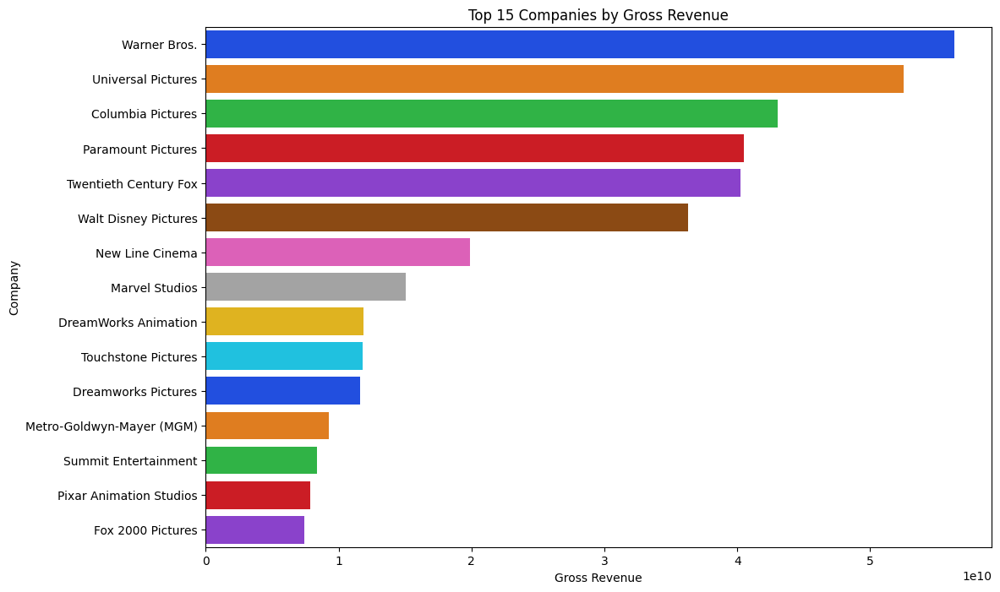

In [183]:
# Plotting the Top 15 companies by gross revenue:
sns.barplot(x=CompanyGrossSum_Sorted.values, y=CompanyGrossSum_Sorted.index, hue = CompanyGrossSum_Sorted.index, legend=False, palette='bright')
plt.xlabel('Gross Revenue')
plt.ylabel('Company')
plt.title('Top 15 Companies by Gross Revenue')
plt.show()

In [168]:
# Top 15 companies by gross revenue per year:
CompanyGrossSum_per_year = df.groupby(['company', 'release_year'])[["gross"]].sum()

CompanyGrossSum_Sorted1 = CompanyGrossSum_per_year.reset_index().sort_values(['gross','company','release_year'], ascending = False)[:15]

CompanyGrossSum_Sorted1['gross'] = CompanyGrossSum_Sorted1['gross'].astype('int64')

CompanyGrossSum_Sorted1

,company,release_year,gross
4223,Walt Disney Pictures,2019,5773131804
2734,Marvel Studios,2018,4018631866
4120,Universal Pictures,2015,3834354888
4013,Twentieth Century Fox,2009,3793491246
4221,Walt Disney Pictures,2017,3789382071
3198,Paramount Pictures,2011,3565705182
4259,Warner Bros.,2010,3300479986
4260,Warner Bros.,2011,3168551343
4214,Walt Disney Pictures,2010,3104474158
3201,Paramount Pictures,2014,3071298586


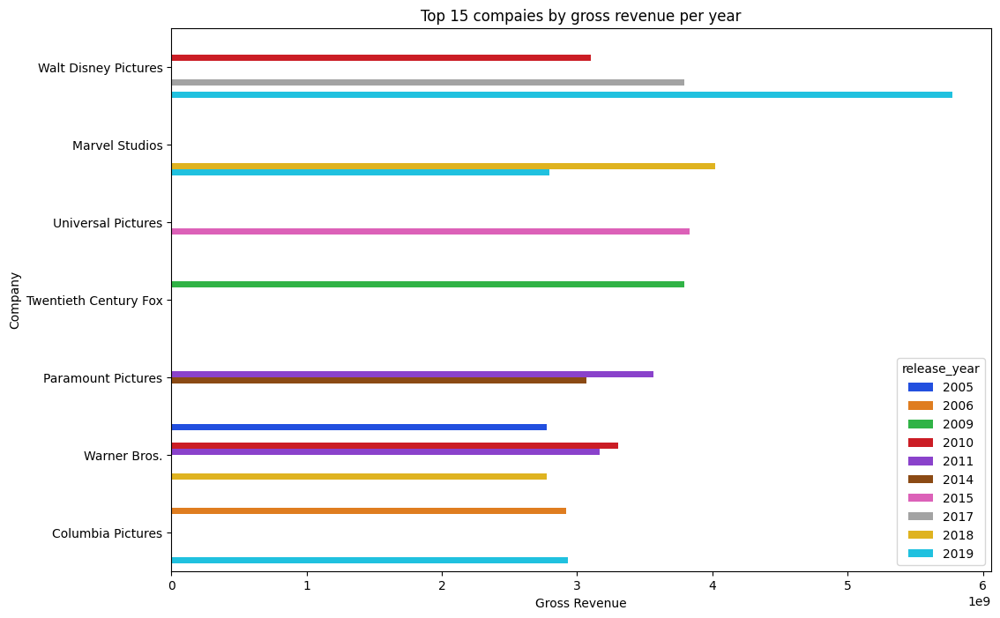

In [184]:
# Plotting the Top 15 companies by gross revenue per year:
sns.barplot(x='gross', y='company', hue='release_year', data=CompanyGrossSum_Sorted1,  palette='bright')
plt.xlabel('Gross Revenue')
plt.ylabel('Company')
plt.title('Top 15 compaies by gross revenue per year')
plt.show()